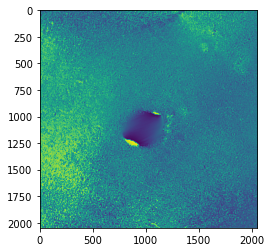

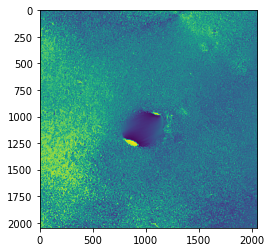

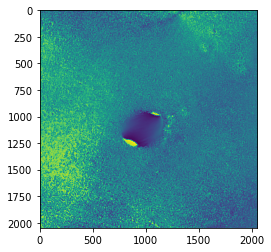

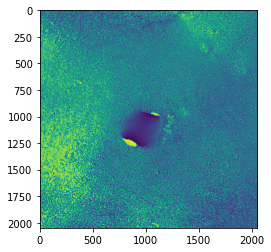

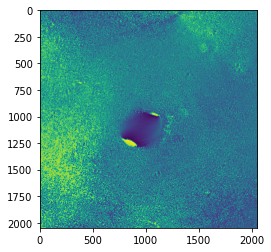

...

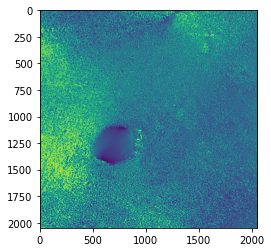

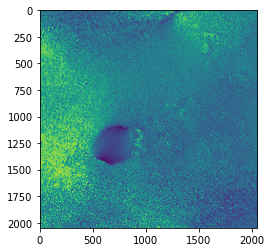

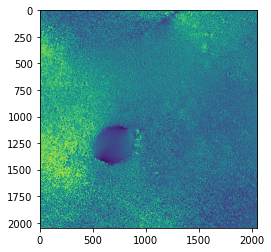

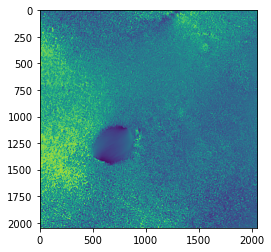

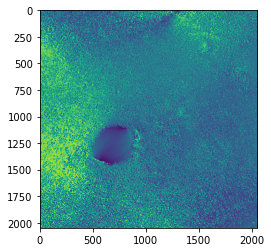

In [15]:
fpath = r'/Users/ryan/Desktop/J. Brugués/PLM_data/20221220_1100 Allyson_polscope'
fname = r'SMS_2017_0713_1435_1_Slow_Axis_Orientation.tif'
a = io.imread(os.path.join(fpath, fname))
print(a.shape)

print('sum projection over time dimension:')
plt.figure(figsize = (10,10))
plt.imshow(a.sum(axis = 0))
plt.axis('off')
plt.show()

os.makedirs(fpath + '/orientation slices')
save_path = fpath + '/orientation slices'

print('')
for i in range(a.shape[0]):
    i_a = a[i,...]
    plt.imshow(i_a)
    plt.axis('off')
    plt.show()
    io.imsave(os.path.join(save_path, str(i) + '.tif'), i_a)
    
## temp load & process orientation files from spindle movie
#fpath = r'/Users/ryan/Desktop/J. Brugués/PLM_data/20221220_1100 Allyson_polscope/orientation_timepoints'
#
#files = os.listdir(fpath)
#tpts = []
#for i in files:
#    if i.endswith('.tif'):
#        a = io.imread(os.path.join(fpath, i))
#        a = np.around((a/100).astype(np.float), decimals = 3)
#        tpts.append(a)

# -----------------------

In [ ]:
## 'Rotate' PLM angles .csv files for paper
##E13.5#1: 115.30  
##E13.5#2: 82.3  
##E13.5#3: 86.9
##
##E15.5#1: 78.4  
##E15.5#2: 75  
##E15.5#3: 75.3
##
##E17.5#1: 86.6  
##E17.5#2: 80.8  
##E17.5#3: 90

fpath = r'/Users/ryan/Desktop/Diana | Suture/PLM/coronal_sections/Orientation'
fname = 'E17.5#3_Orientation idx roi only angle distribution'
rot_ang = 90

file = np.loadtxt(os.path.join(fpath, fname + '.csv'), delimiter=',')

plt.hist(file, bins = 'fd')
plt.show()

rot_file = []
for i in file:
    if i < rot_ang:
        rot_file.append(i - rot_ang + 180)
    else:
        rot_file.append(i - rot_ang)
plt.hist(rot_file, bins = 'fd')
plt.show()

np.savetxt(os.path.join(fpath, fname + ' rotated.csv'), rot_file, delimiter=',')

# save angle values as .csv files for export & plotting
paper_path = r'/Users/ryan/Desktop/Diana | Suture/PLM/coronal_sections/Orientation'
ROIs = []
NMs = []
for i in os.listdir(paper_path):
    if i.endswith('roi only.tif'):
        NMs.append(i)
        ROIs.append(io.imread(os.path.join(paper_path,i)))
    else:
        continue
        
for i in range(len(ROIs)):
    plt.hist(ROIs[i][ROIs[i]>0], bins = 'fd')
    #np.savetxt(os.path.join(paper_path, NMs[i][:-4] + ' angle distribution.csv'), ROIs[i][ROIs[i] > 0], delimiter=',')
    plt.show()